# Augmentation Analysieren

Das Ziel ist es die einzelnen Augmentationen auf plausibilität zu untersuchen.

In [ ]:
import os
print(os.getcwd())
if os.getcwd().endswith("Eda"):
    os.chdir("..")


from src.modelling import CCV1_Trainer
from src.augmentation import CCV1Transformer,None_Transform
from src.data_modules import DataModule
from torch import nn
import torch
from torchvision import transforms,models
import matplotlib.pyplot as plt

## Funktionen für die Visualsierungen

In [92]:
def images_transformed(transformation,number,turn_off_to_tensor:bool=False):
    if turn_off_to_tensor:
        first_trans=None_Transform()
        last_trans = transforms.ToTensor()
    else:
        first_trans=transforms.ToTensor()
        last_trans = None_Transform()
    data_module_rotation = DataModule(
        transforms.Compose([
            first_trans,
            transformation,
            last_trans
            ]))
    data_module_rotation.prepare_data(0)
    toPil =transforms.ToPILImage()
    loader = iter(data_module_rotation.train_dataloader(1))
    return [toPil(next(loader)["image"][0]) for n in range(number)]

def create_image_grid(transformation,number,turn_off_to_tensor:bool=False):
    fig, axes = plt.subplots(nrows=number, ncols=2, figsize=(15, number*5))
    images_trans=images_transformed(transformation,number,turn_off_to_tensor)
    images_no_trans=images_transformed(None_Transform(),number)
    for n,ax in enumerate(axes):
        ax[0].imshow(images_trans[n])
        ax[1].imshow(images_no_trans[n])

### Rotation

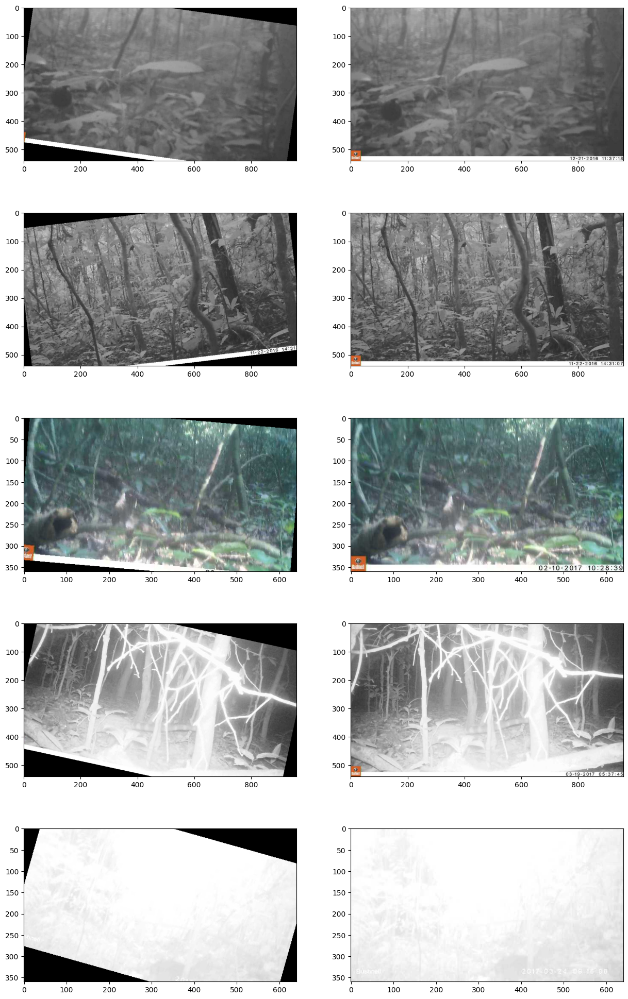

In [93]:
create_image_grid(transforms.RandomRotation(20),5)

### Horizontale Drehung

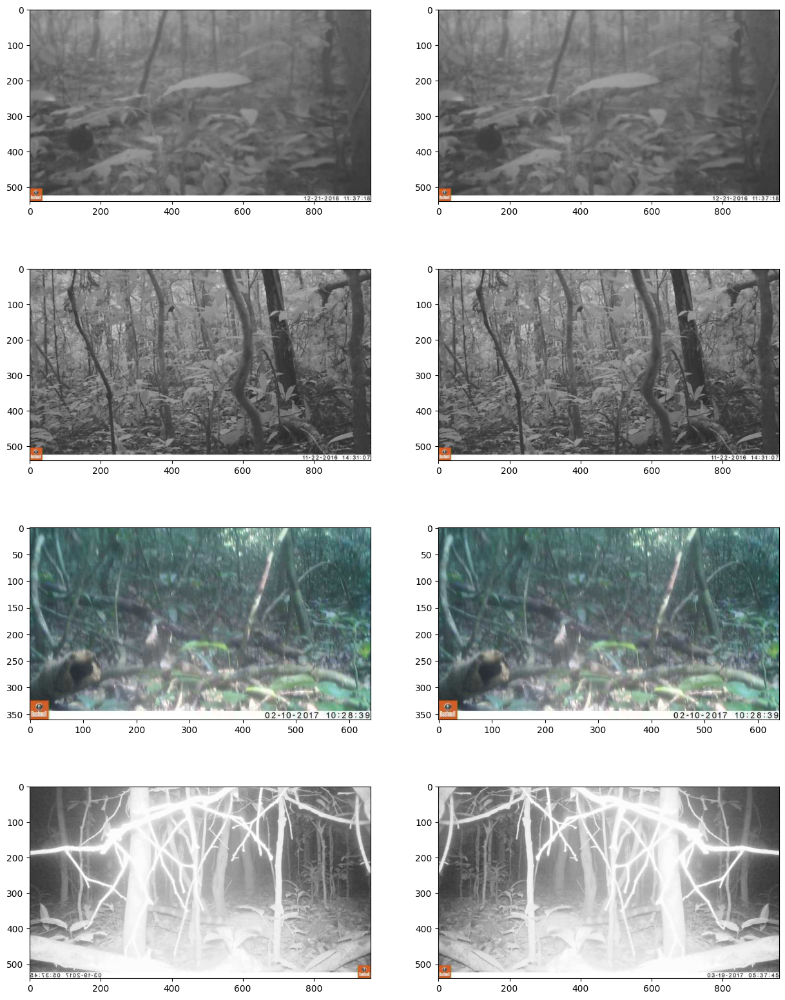

In [84]:
create_image_grid(transforms.RandomHorizontalFlip(),4)

# unterschiedliche Perspektiven

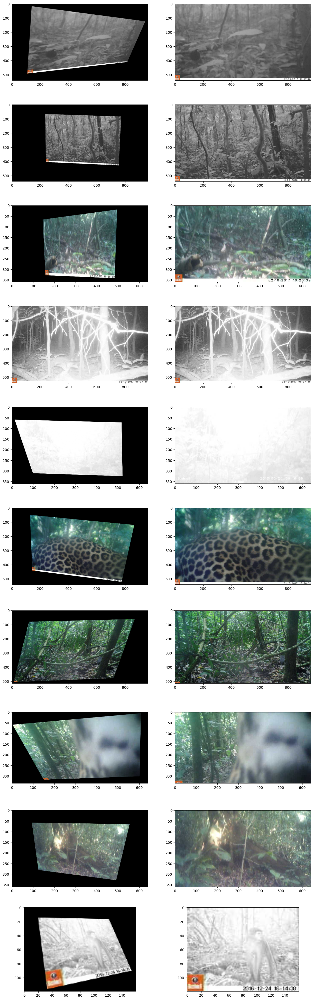

In [85]:
create_image_grid(transforms.RandomPerspective(),10)

### Farbanpassungen

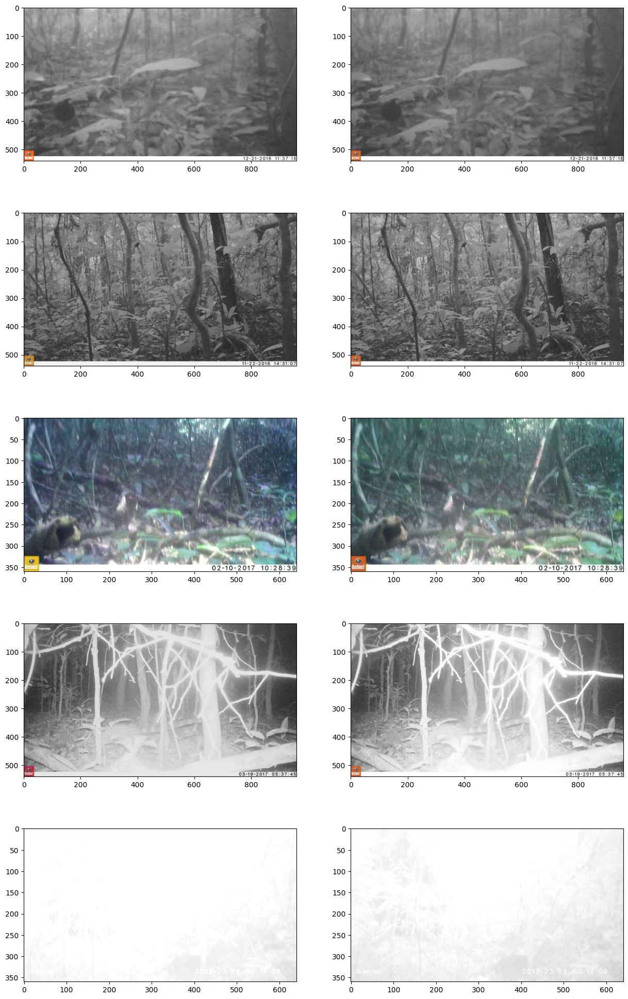

In [86]:
create_image_grid(transforms.ColorJitter(brightness=0.1,contrast=0.1,saturation=0.1,hue=0.1),5)

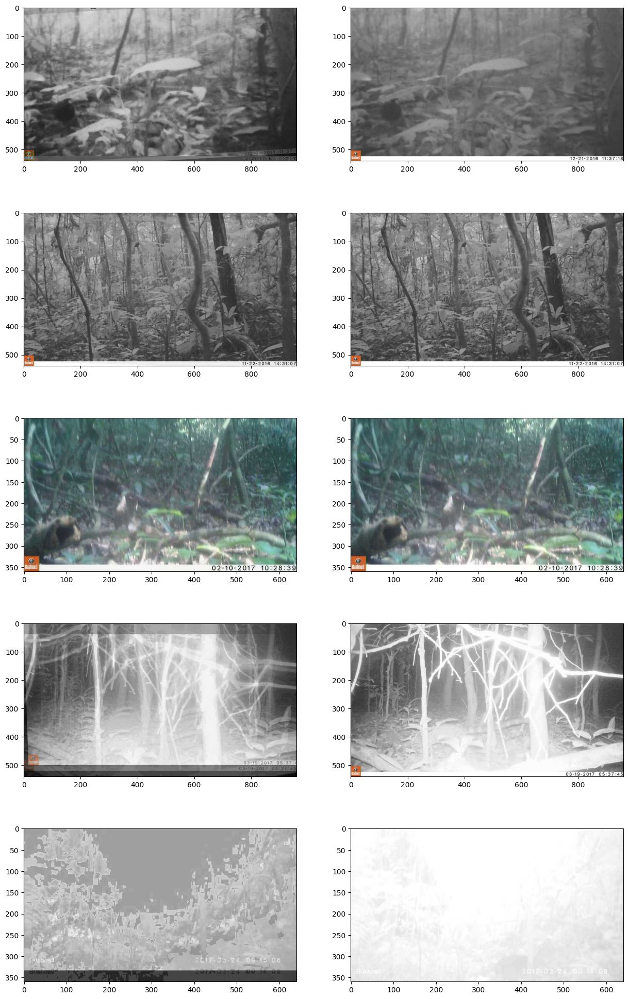

In [94]:
create_image_grid(transforms.AugMix(),5,True)